# 1. Image Processing for Ai

## Some Image Processing Terms & Definitions

1. Inverted Images - Reverse colors before performing any data extraction process.
2. Rescaling - Resizing.
3. Binarization - the step that is actually performed prior to performing OCR. The aim of binarization is to separate foreground text from the background of a document.
4. Noise Removal - Image noise is undesired random variation of brightness or color data in images.
5. Dilation and Erosion - Dilation adds pixels to the boundaries of objects in an image, while erosion removes pixels on object boundaries.
6. Rotation / Deskewing - Deskewing is a process whereby skew is removed by rotating an image by the same amount as its skew but in the opposite direction.
7. Removing Borders - Getting rid of the background sections outside of the desired section (for data extraction). 
8. Missing Borders - Confusion caused by lack of boundaries around the desired section (for data extraction).
9. Transparency / Alpha Channel - (Also called alpha planes) is a color component that represents the degree of transparency (or opacity) of a color; It is used to determine how a pixel is rendered when blended with another.

In [1]:
# Importing libraries
import cv2
from matplotlib import pyplot as plt
import numpy as np

## Input / Open Image

In [2]:
image_path = "Image_Samples/Flight_Mechanics_Intro.png"
img = cv2.imread(image_path)

In [3]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize = figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap = 'gray')

    plt.show()

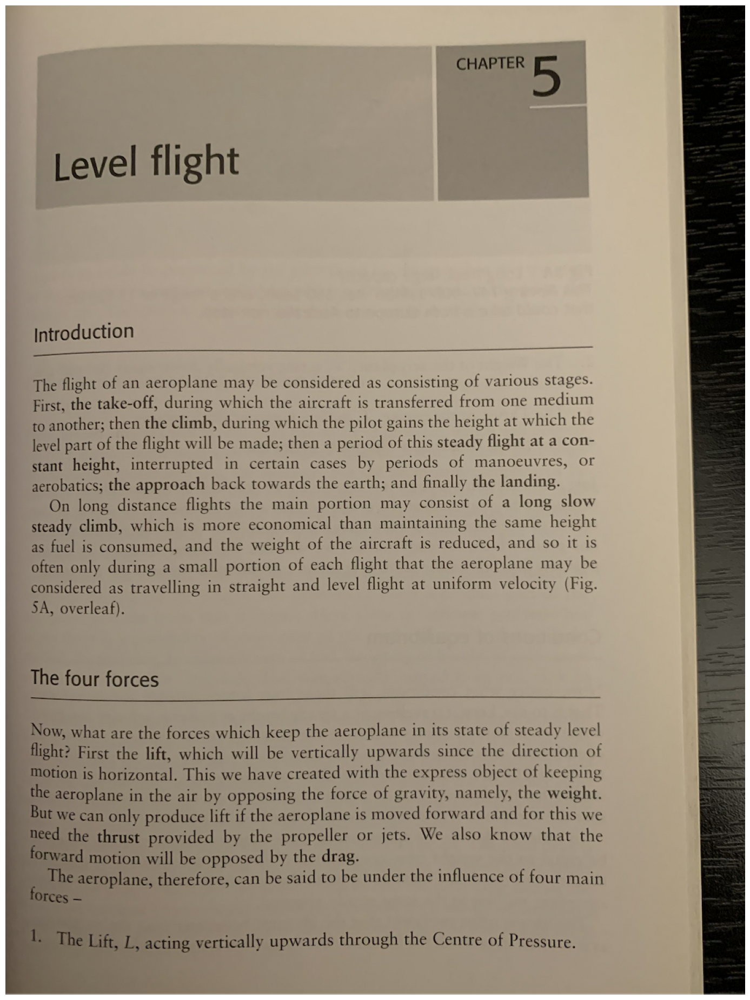

In [7]:
display(image_path)

## Invert Image

In [5]:
inverted_image = cv2.bitwise_not(img)
cv2.imwrite("Image_Processing_Results/inverted_Flight_Mechanics_Intro.png", inverted_image)

True

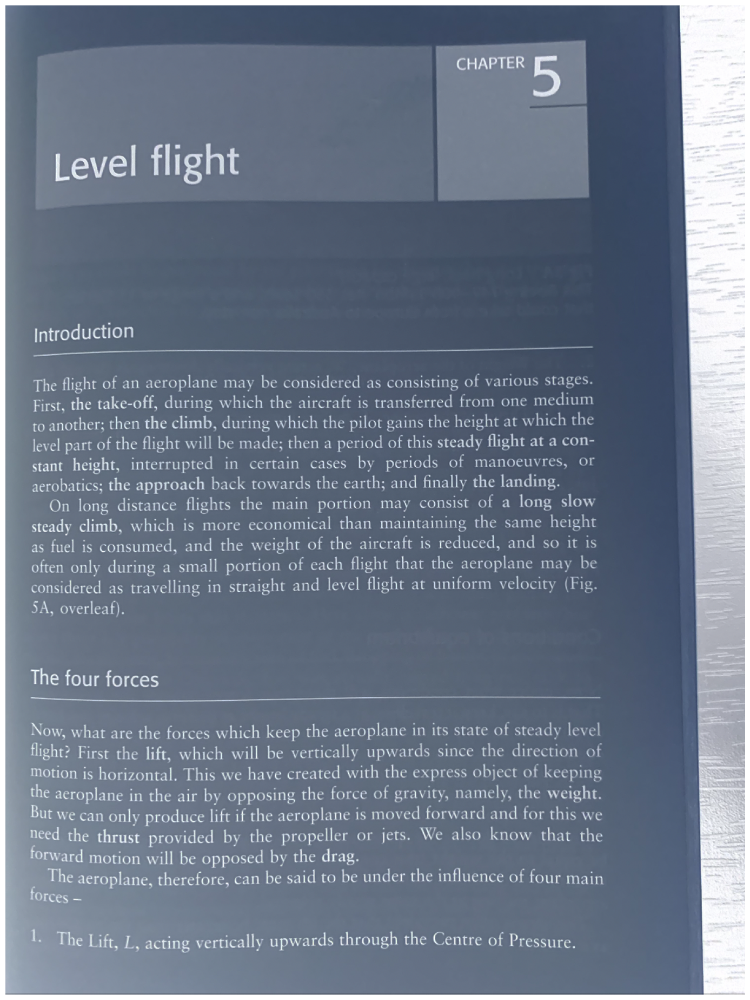

In [14]:
display("Image_Processing_Results/inverted_Flight_Mechanics_Intro.png")

## Binarization

In [6]:
def grayscale(im_path):
    return cv2.cvtColor(im_path, cv2.COLOR_BGR2GRAY)

In [7]:
gray_image = grayscale(img)
cv2.imwrite("Image_Processing_Results/gray_Flight_Mechanics_Intro.png", gray_image)

True

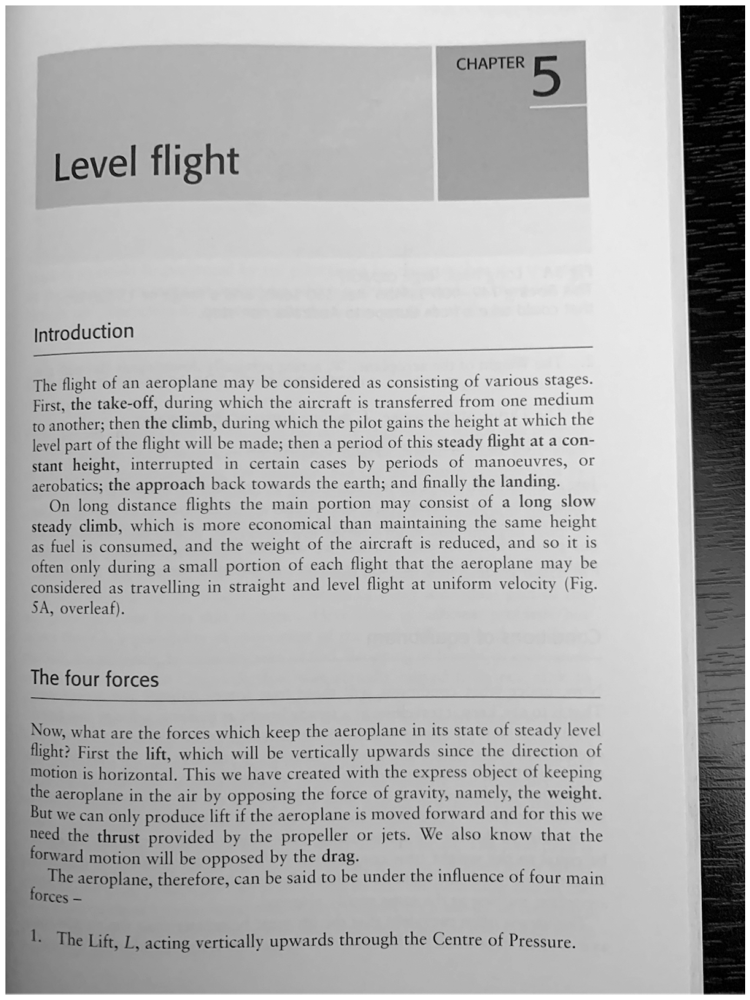

In [18]:
display("Image_Processing_Results/gray_Flight_Mechanics_Intro.png")

In [8]:
# all pixels value above 103 will be set to 255
thresh, im_bw = cv2.threshold(gray_image, 102, 255, cv2.THRESH_BINARY)
cv2.imwrite("Image_Processing_Results/im_bw_Flight_Mechanics_Intro.png", im_bw)

True

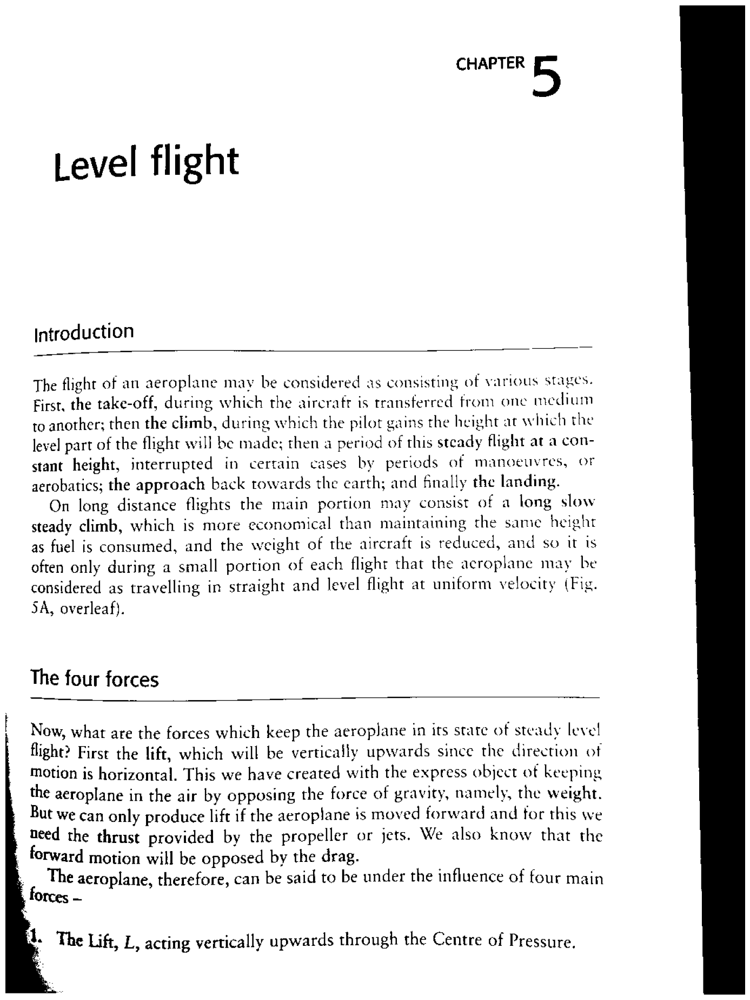

In [20]:
display("Image_Processing_Results/im_bw_Flight_Mechanics_Intro.png")

## Noise Removal

In [9]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations = 1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations = 1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [10]:
no_noise = noise_removal(im_bw)
cv2.imwrite("Image_Processing_Results/no_noise_Flight_Mechanics_Intro.png", no_noise)

True

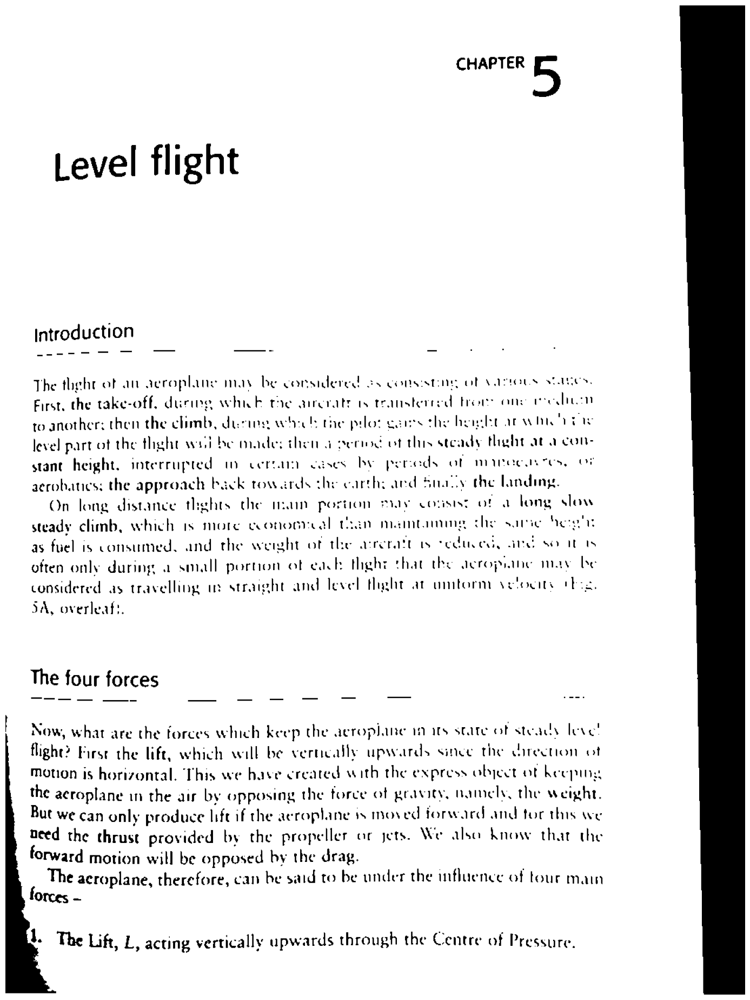

In [23]:
display("Image_Processing_Results/no_noise_Flight_Mechanics_Intro.png")

## Dilation and Erosion

In [11]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations = 1)
    image = cv2.bitwise_not(image)
    return (image)

In [12]:
eroded_image = thin_font(no_noise)
cv2.imwrite("Image_Processing_Results/eroded_Flight_Mechanics_Intro.png", eroded_image)

True

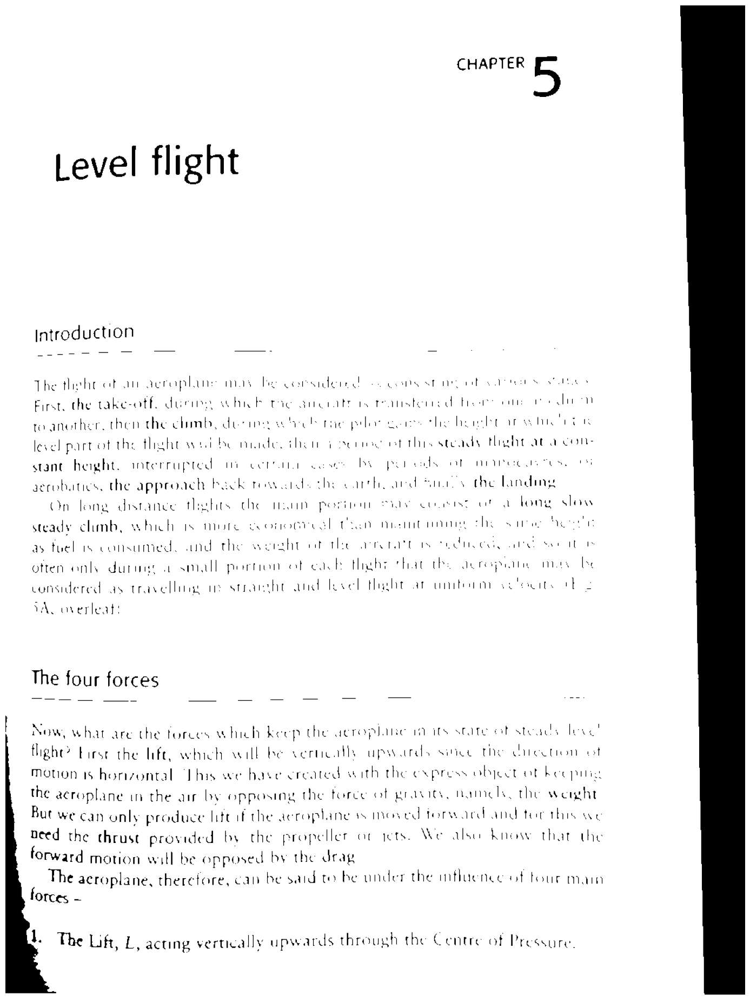

In [26]:
display("Image_Processing_Results/eroded_Flight_Mechanics_Intro.png")

In [13]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [14]:
dilated_image = thick_font(no_noise)
cv2.imwrite("Image_Processing_Results/dilated_Flight_Mechanics_Intro.png", dilated_image)

True

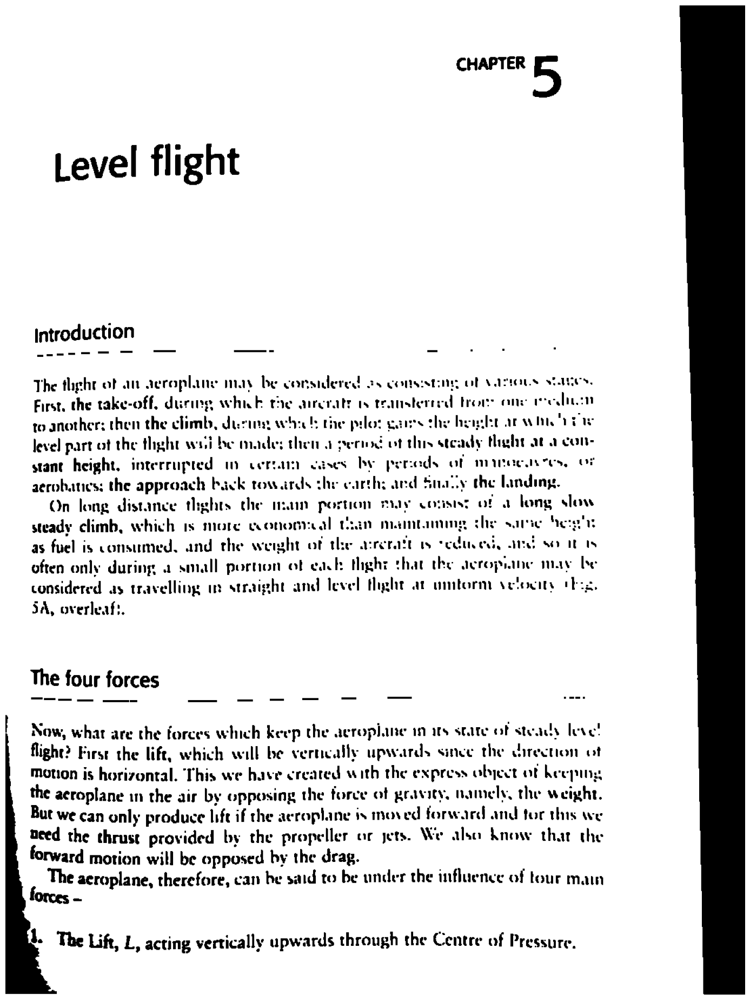

In [29]:
display("Image_Processing_Results/dilated_Flight_Mechanics_Intro.png")

## Rotation / Deskewing

In [15]:
new = cv2.imread("Image_Samples/Rotated_Flight_Mechanics_Intro.png")

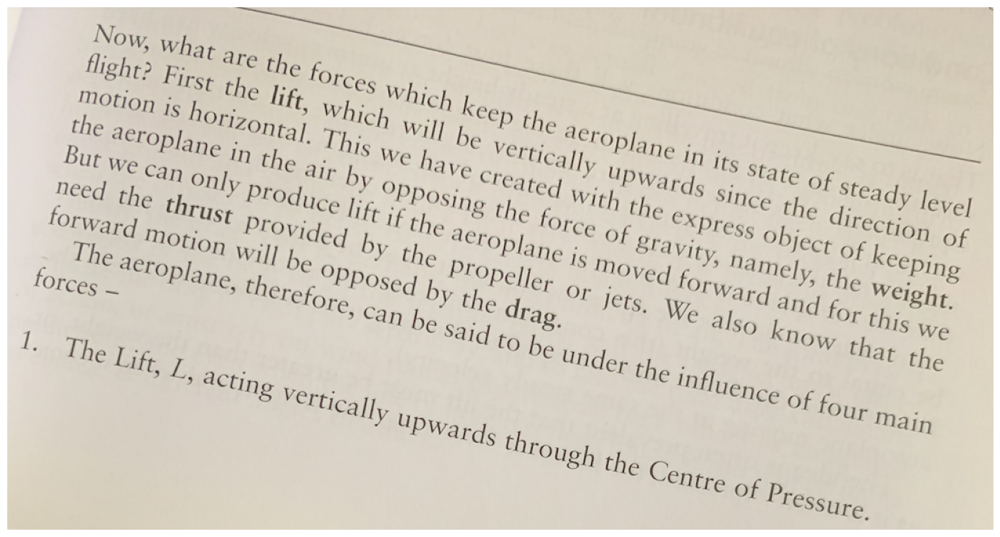

In [57]:
display("Image_Samples/Rotated_Flight_Mechanics_Intro.png")

In [16]:
def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle

# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [17]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [18]:
fixed = deskew(new)
cv2.imwrite("Image_Processing_Results/rotation_fixed_Flight_Mechanics_Intro.png", fixed)

123


True

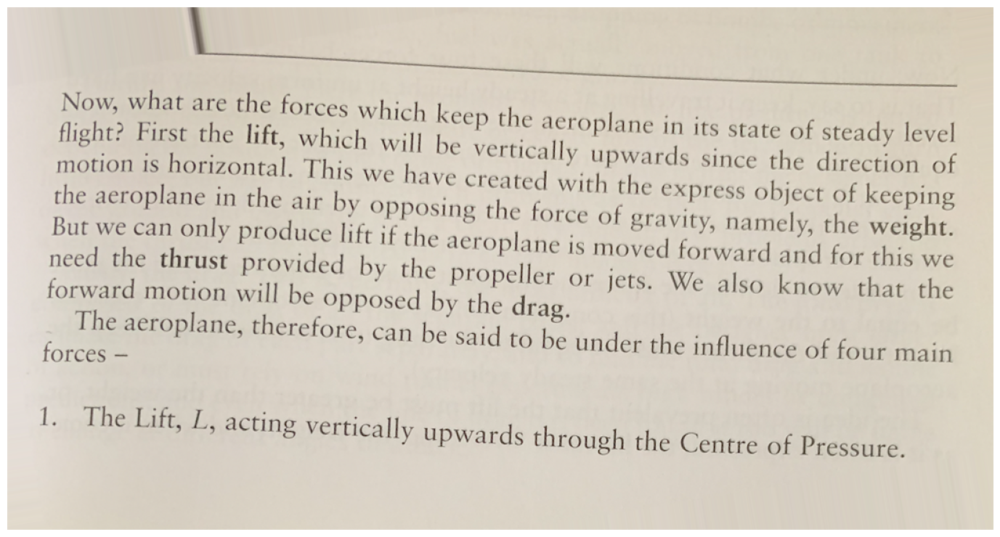

In [45]:
display("Image_Processing_Results/rotation_fixed_Flight_Mechanics_Intro.png")

## Removing Borders

In [19]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

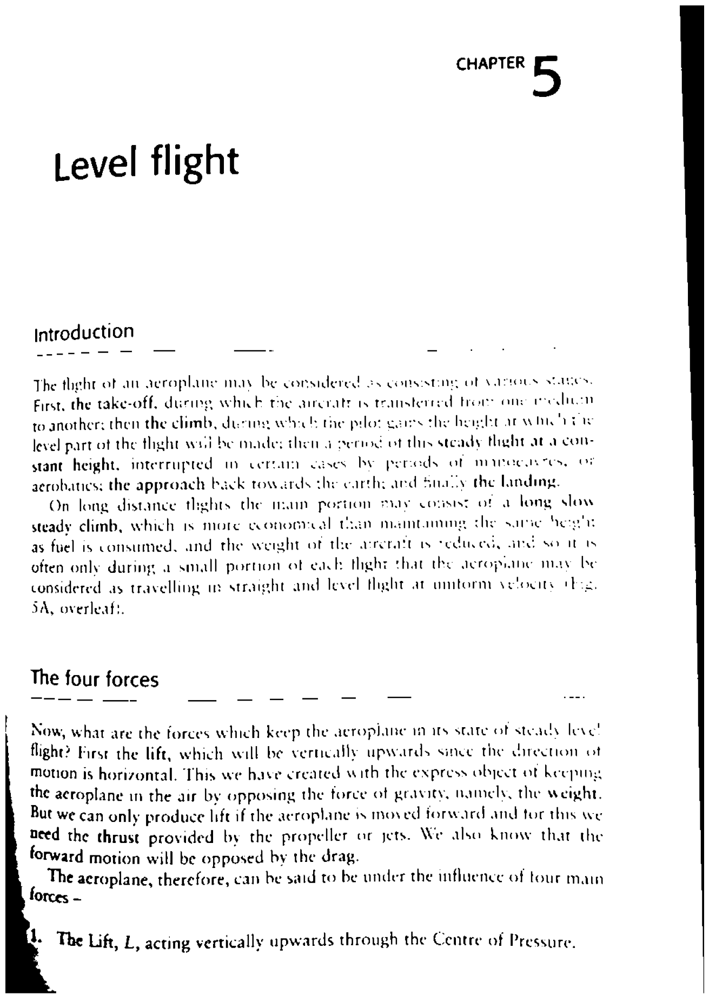

In [20]:
no_borders = remove_borders(no_noise)
cv2.imwrite("Image_Processing_Results/no_borders_Flight_Mechanics_Intro.png", no_borders)
display("Image_Processing_Results/no_borders_Flight_Mechanics_Intro.png")

# 2. Optical Character Recognition (OCR) for Text in PDFs

In [28]:
from PIL import Image # Pillow library - for imaging & manipulation
from PIL import ImageGrab
from pytesseract import * # Pytesseract - optical character recognition (OCR) tool. It will recognize/“read” image text

In [29]:
image_file = "Image_Processing_Results/inverted_Flight_Mechanics_intro.png"
im = Image.open(image_file)
text = image_to_string(im)
text = image_to_string(image_file)
#text = image_to_string(image_file, graceful_errors=True)
print("=====output=======\n")
print(text)

=====output=======

CHAPTER 5
Level flight

Introduction

The flight of an aeroplane may be considered as consisting of various stages.
First, the take-off, during which the aircraft is transferred from one medium
to another; then the climb, during which the pilot gains the height at which the
level part of the flight will be made; then a period of this steady flight at a con-
stant height, interrupted in certain cases by periods of manoeuvres, or
aerobatics; the approach back towards the earth; and finally the landing.

On long distance flights the main portion may consist of a long slow
steady climb, which is more economical than maintaining the same height
as fuel is consumed, and the weight of the aircraft is reduced, and so it is
often only during a small portion of each flight that the aeroplane may be
considered as travelling in straight and level flight at uniform velocity (Fig.

5A, overleaf).

The four forces

Now, what are the forces which keep the aeroplane in its state of 

In [30]:
image_file = "Image_Samples/Flight_Mechanics_Intro.png"
im = Image.open(image_file)
text = image_to_string(im)
text = image_to_string(image_file)
#text = image_to_string(image_file, graceful_errors=True)
print("=====output=======\n")
print(text)

=====output=======

CHAPTER 5
Level flight

Introduction

The flight of an aeroplane may be considered as consisting of various stages.
First, the take-off, during which the aircraft is transferred from one medium
to another; then the climb, during which the pilot gains the height at which the
level part of the flight will be made; then a period of this steady flight at a con-
stant height, interrupted in certain cases by periods of manoeuvres, or
aerobatics; the approach back towards the earth; and finally the landing.

On long distance flights the main portion may consist of a long slow
steady climb, which is more economical than maintaining the same height
as fuel is consumed, and the weight of the aircraft is reduced, and so it is
often only during a small portion of each flight that the aeroplane may be
considered as travelling in straight and level flight at uniform velocity (Fig.

5A, overleaf).

The four forces

Now, what are the forces which keep the aeroplane in its state of 

In [31]:
image_file = "Image_Samples/Handwritten_Letter.png"
im = Image.open(image_file)
text = image_to_string(im)
text = image_to_string(image_file)
#text = image_to_string(image_file, graceful_errors=True)
print("=====output=======\n")
print(text)

=====output=======

Dear Reade,

is Juan ~Leonardo Moctezuma—Flores | eval

a name
More about OGR tal

my goal is to learn

image processing, I hope you enjoy co) project.

Best Regards j

Juan




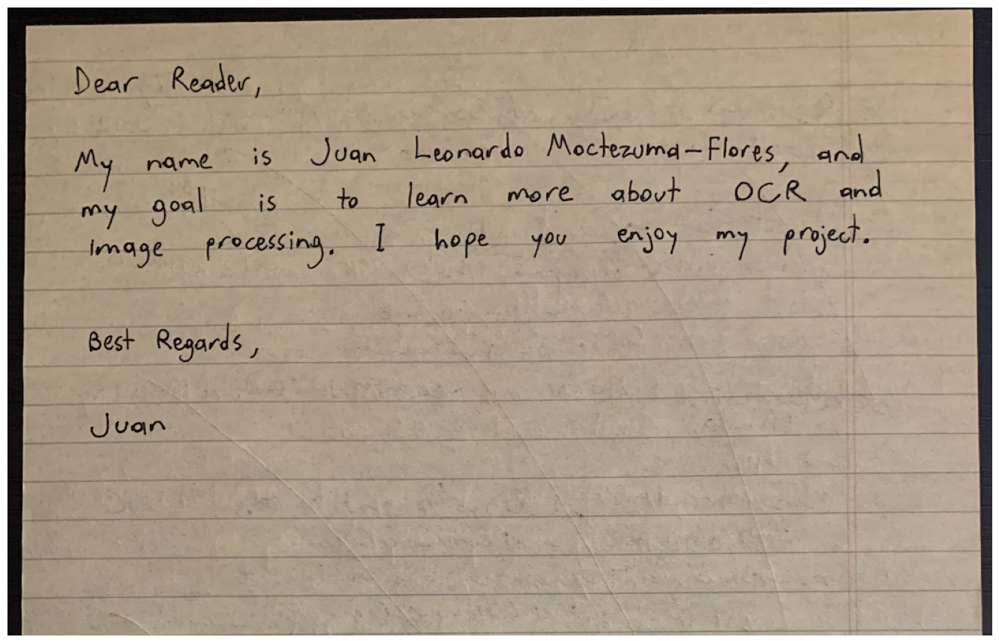

In [32]:
display("Image_Samples/Handwritten_Letter.png")